In [15]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=[]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: CUDA_VISIBLE_DEVICES=[]


### Canary vocalizations
Source:
- https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1003052
- /mnt/cube/Datasets/canary/FromYarden2018
- http://localhost:8186/tree/tsainbur/Projects/github_repos/animalvocalizationgenerativenet/notebooks/birdsong/canary

In [16]:
from pathlib2 import Path
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import re
import IPython
from praatio import tgio
from datetime import datetime
import seaborn as sns

In [17]:
from avgn_paper.signalprocessing import spectrogramming as sg

In [18]:
import pdb
from joblib import Parallel, delayed
n_jobs = 10
verbosity = 5

In [19]:
from tqdm.autonotebook import tqdm
from librosa.core.time_frequency import mel_frequencies
from avgn_paper.signalprocessing.spectrogramming_tf import spectrogram_tensorflow
from avgn_paper.utils.audio import load_wav, float32_to_int16, int16_to_float32, write_wav
from avgn_paper.visualization.spectrogram import visualize_spec, plot_spec
from avgn_paper.utils.general import HParams
from avgn_paper.signalprocessing.filtering import butter_bandpass_filter

### data locations

In [20]:
DSLOC = Path('/mnt/cube/Datasets/canary/FromYarden2018')

In [23]:
DSLOC.as_posix()

'/mnt/cube/Datasets/canary/FromYarden2018'

In [21]:
DSLOC.stem

'FromYarden2018'

In [7]:
TGLIST = np.array(list((DSLOC).expanduser().glob('TextGrids/*.TextGrid')))
TGLIST = np.array([i for i in TGLIST if i.stem[0] != '.'])
TGLIST[0], len(TGLIST)

(PosixPath('/mnt/cube/Datasets/canary/FromYarden2018/TextGrids/bird1_0008_2004_03_06_08_22.TextGrid'),
 2556)

In [8]:
WAVLIST = np.array(list((DSLOC).expanduser().glob('*/*.wav')))
WAVLIST[0], len(WAVLIST)

(PosixPath('/mnt/cube/Datasets/canary/FromYarden2018/bird_3/bird3_0067_2004_03_07_15_36.wav'),
 3776)

### loop through textgrids, grab phrases

In [9]:
wav_stems = np.array([i.stem for i in WAVLIST])

In [10]:
def get_phrases(tg, WAVLIST, wav_stems):
    phrase_df = pd.DataFrame(
    columns=[
        "indv",
        "rendition",
        "datetime",
        "wavloc",
        "tgloc",
        "phrase_num",
        "phrase_start",
        "vocdata",
        "rate",
        "voc_len",
    ]
    )
    indv, rendition, year, month, day, hour, minute = tg.stem.split('_')
    dt = '-'.join([year, month, day, hour, minute])
    dt = datetime.strptime(dt, "%Y-%m-%d-%H-%M")
    wf = WAVLIST[wav_stems == tg.stem][0]
    rate, data = load_wav(wf)
    textgrid = tgio.openTextgrid(fnFullPath=tg)
    tier = textgrid.tierDict['syllables'].entryList
    for inti, interval in enumerate(tier):
        phrasedata = data[int(interval.start*rate):int(interval.end*rate)]
        
        
        phrase_df.loc[len(phrase_df)] = [
            indv, rendition, dt, wf, tg, inti, interval.start, phrasedata, rate, len(phrasedata)/rate
        ]
    return phrase_df

In [11]:
with Parallel(n_jobs=24, verbose=verbosity) as parallel:
    phrase_df = parallel(
        delayed(get_phrases)(tg, WAVLIST, wav_stems)
        for tg in tqdm(TGLIST)
    )
phrase_df = pd.concat(phrase_df)

[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done  24 tasks      | elapsed:    4.0s
[Parallel(n_jobs=24)]: Done 114 tasks      | elapsed:    5.5s
[Parallel(n_jobs=24)]: Done 240 tasks      | elapsed:    7.5s
[Parallel(n_jobs=24)]: Done 402 tasks      | elapsed:   10.1s
[Parallel(n_jobs=24)]: Done 600 tasks      | elapsed:   13.4s
[Parallel(n_jobs=24)]: Done 834 tasks      | elapsed:   17.2s
[Parallel(n_jobs=24)]: Done 1104 tasks      | elapsed:   21.6s
[Parallel(n_jobs=24)]: Done 1410 tasks      | elapsed:   26.8s
[Parallel(n_jobs=24)]: Done 1752 tasks      | elapsed:   32.3s
[Parallel(n_jobs=24)]: Done 2130 tasks      | elapsed:   38.5s


[Parallel(n_jobs=24)]: Done 2556 out of 2556 | elapsed:   45.4s finished


In [12]:
phrase_df[:3]

,indv,rendition,datetime,wavloc,tgloc,phrase_num,phrase_start,vocdata,rate,voc_len
0,bird1,0008,2004-03-06 08:22:00,/mnt/cube/Datasets/canary/FromYarden2018/bird_...,/mnt/cube/Datasets/canary/FromYarden2018/TextG...,0,0.062792,"[26, 51, 72, 70, 75, 52, 32, 22, 2, -5, -16, -...",48000,4.354500
1,bird1,0008,2004-03-06 08:22:00,/mnt/cube/Datasets/canary/FromYarden2018/bird_...,/mnt/cube/Datasets/canary/FromYarden2018/TextG...,1,4.438958,"[63, 95, 101, 106, 91, 66, 55, 24, -25, -102, ...",48000,0.414375
2,bird1,0008,2004-03-06 08:22:00,/mnt/cube/Datasets/canary/FromYarden2018/bird_...,/mnt/cube/Datasets/canary/FromYarden2018/TextG...,2,4.875000,"[176, 181, 176, 138, 76, 16, -54, -100, -148, ...",48000,1.018333


In [14]:
len(np.unique(phrase_df.indv))

5

In [13]:
len(phrase_df)

23339

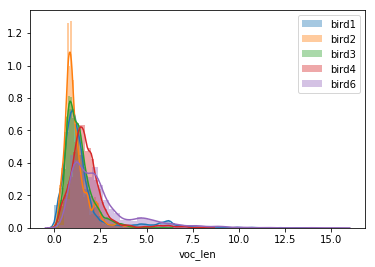

In [24]:
for indv in np.unique(phrase_df.indv):
    sns.distplot(phrase_df[phrase_df.indv==indv]["voc_len"], label=indv)
plt.legend()

In [25]:
rate = phrase_df.rate.values[0]

### Create spectrograms

In [26]:
def prepare_mel_matrix(hparams, return_numpy=True):
    # create a filter to convolve with the spectrogram
    mel_matrix = tf.signal.linear_to_mel_weight_matrix(
        num_mel_bins=hparams.num_mel_bins,
        num_spectrogram_bins=int(hparams.n_fft / 2) + 1,
        sample_rate=rate,
        lower_edge_hertz=hparams.mel_lower_edge_hertz,
        upper_edge_hertz=hparams.mel_upper_edge_hertz,
        dtype=tf.dtypes.float32,
        name=None,
    )
    
    # gets the center frequencies of mel bands
    mel_f = mel_frequencies(
        n_mels=hparams.num_mel_bins + 2,
        fmin=hparams.mel_lower_edge_hertz,
        fmax=hparams.mel_upper_edge_hertz,
    )

    # Slaney-style mel is scaled to be approx constant energy per channel (from librosa)
    enorm = tf.dtypes.cast(
        tf.expand_dims(
            tf.constant(
                2.0 / (mel_f[2 : hparams.num_mel_bins + 2] - mel_f[: hparams.num_mel_bins])
            ),
            0,
        ),
        tf.float32,
    )

    mel_matrix = tf.multiply(mel_matrix, enorm)
    mel_matrix = tf.divide(mel_matrix, tf.reduce_sum(mel_matrix, axis=0))
    if return_numpy:
        return mel_matrix.numpy()
    else:
        return mel_matrix

In [200]:
win_length_ms = 10
hop_length_ms = 2
print(win_length_ms / 1000 * rate)
print(hop_length_ms / 1000 * rate)

hparams = HParams(
    # spectrogramming
    win_length=int(rate / 1000 * win_length_ms),
    n_fft=1024,
    hop_length=int(rate / 1000 * hop_length_ms),
    ref_level_db=20,
    min_level_db=-60,
    preemphasis=0.97,
    # mel scaling
    num_mel_bins=64,
    mel_lower_edge_hertz=500,
    mel_upper_edge_hertz=10000,
    # inversion
    power=1.5,  # for spectral inversion
    griffin_lim_iters=50,
    pad=True,
    #
)
mel_matrix = prepare_mel_matrix(hparams)

480.0
96.0


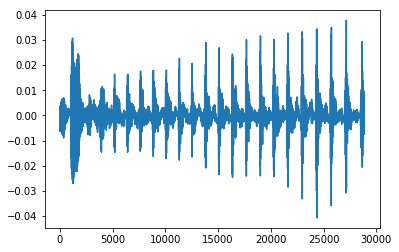

In [201]:
audio = int16_to_float32(phrase_df.vocdata.values[7])
plt.plot(audio)
IPython.display.Audio(data=audio, rate=rate)

0


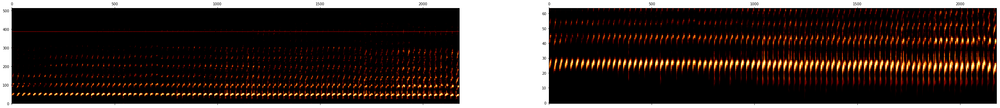

1


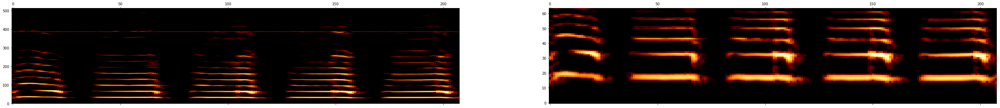

2


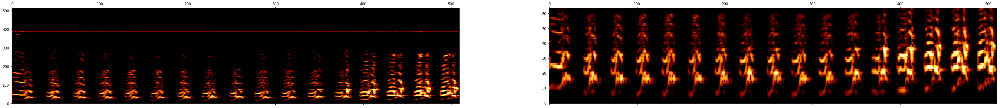

3


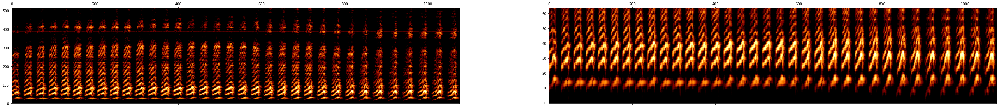

4


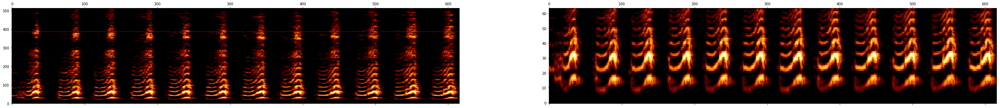

5


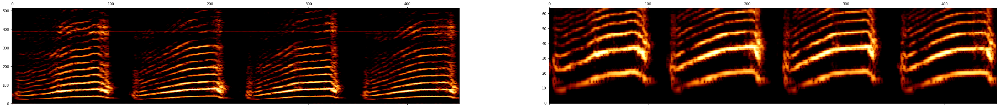

6


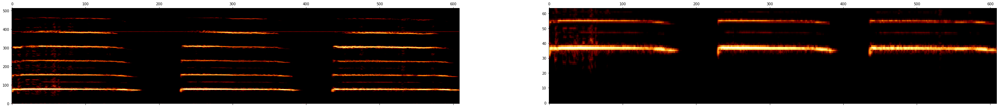

7


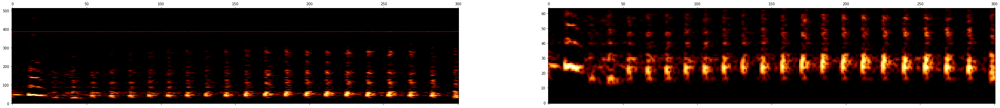

8


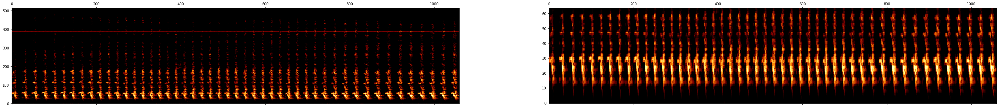

9


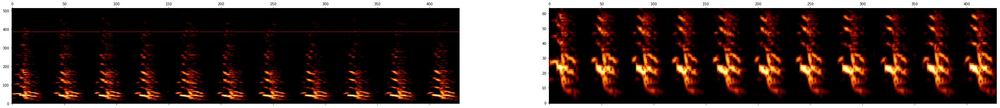

10


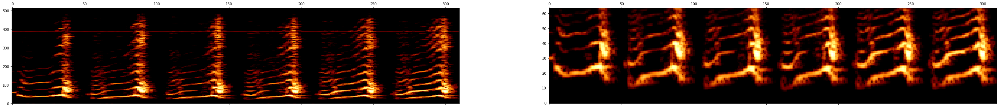

11


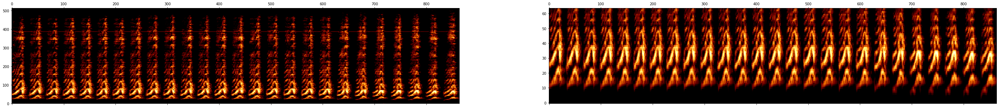

12


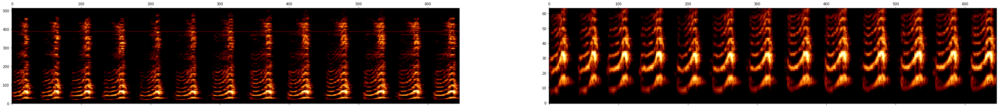

13


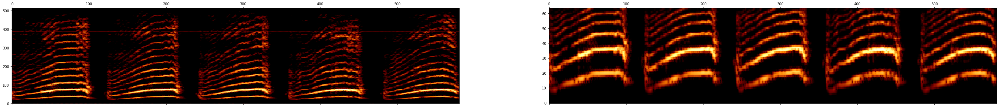

14


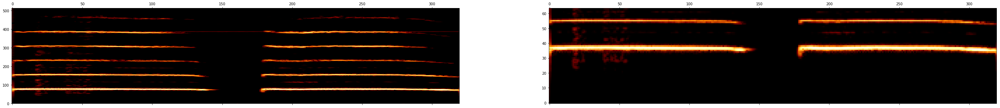

15


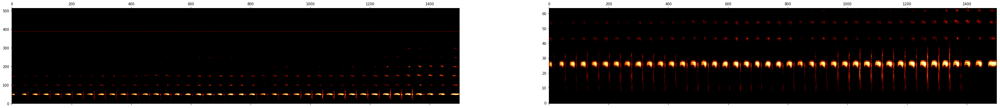

16


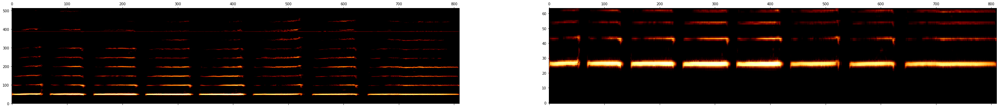

17


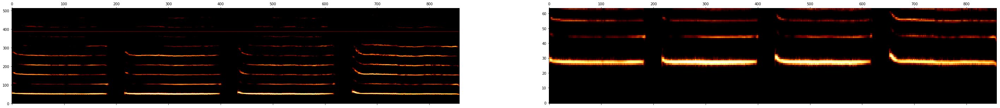

18


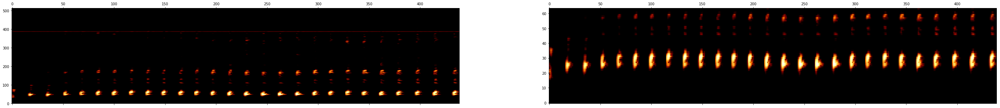

19


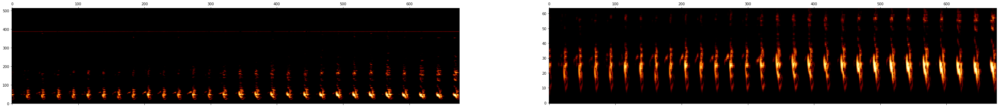

20


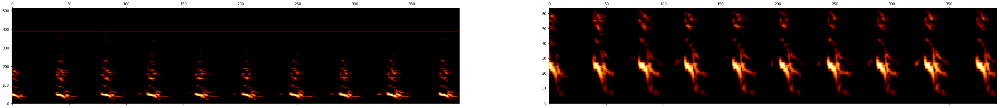

21


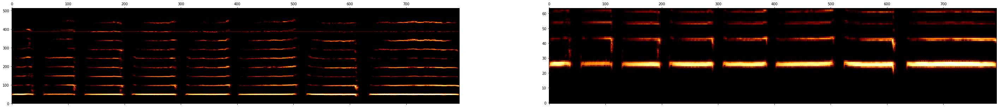

22


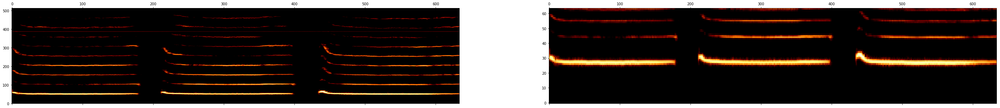

23


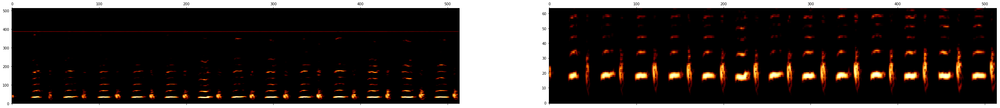

24


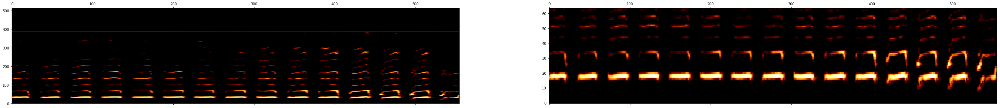

25


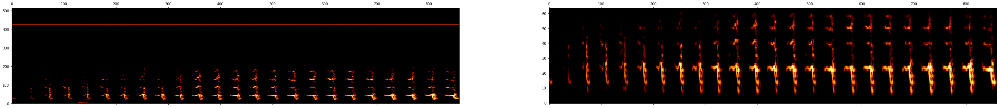

26


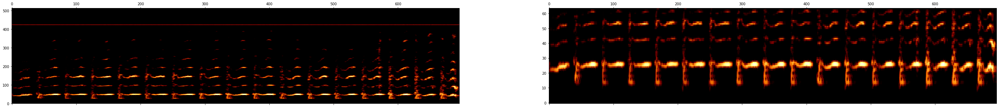

27


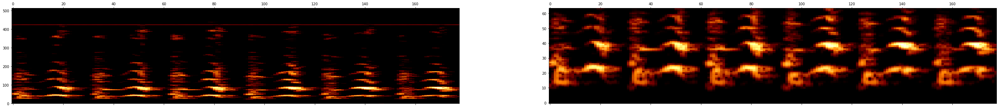

28


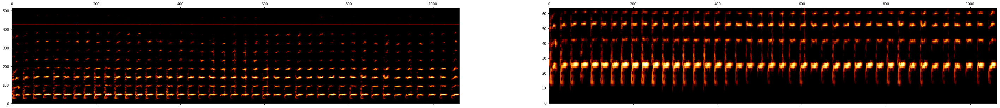

29


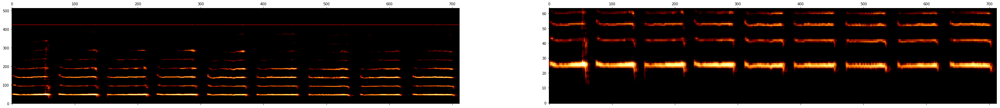

30


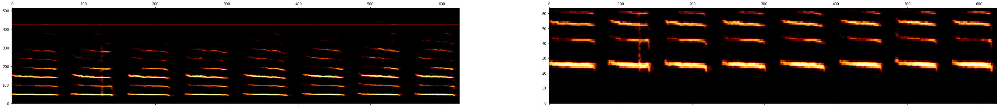

31


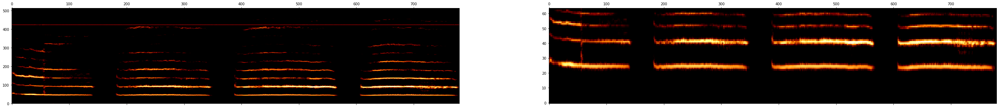

32


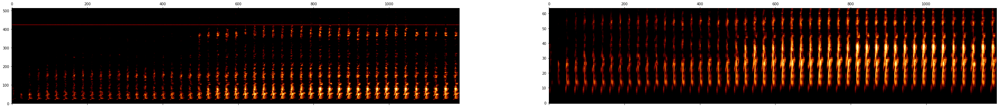

33


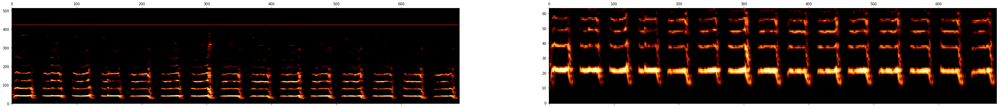

34


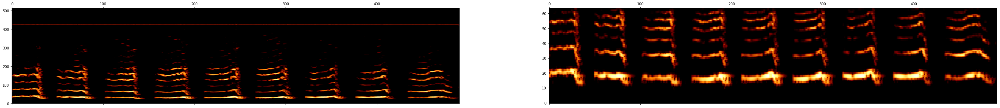

35


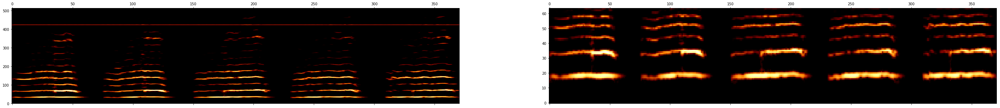

36


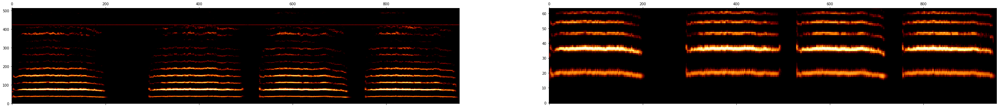

37


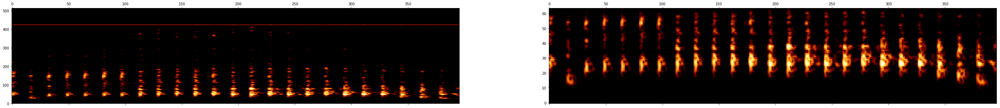

38


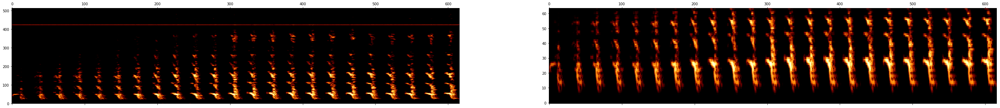

39


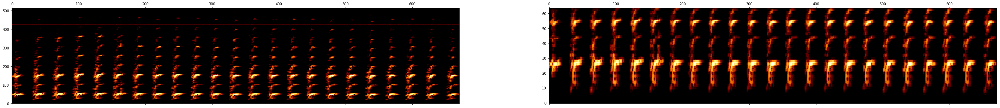

40


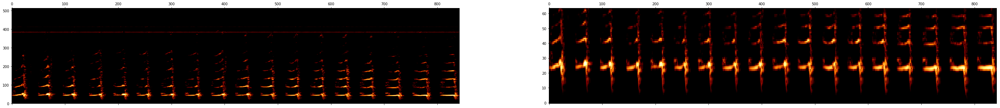

41


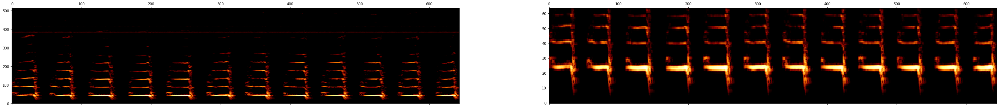

42


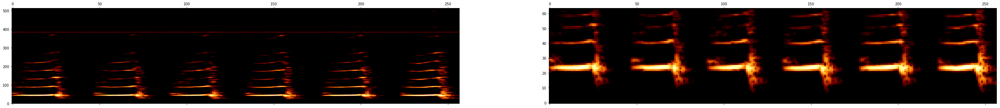

43


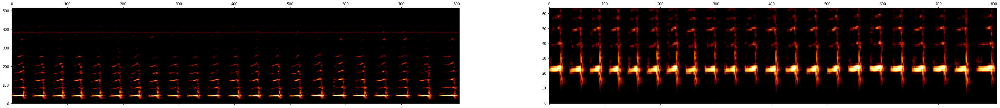

44


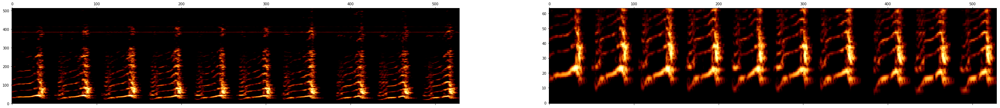

45


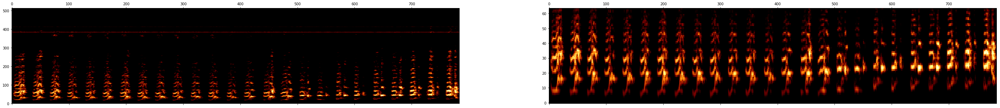

46


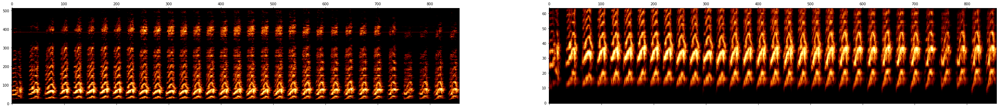

47


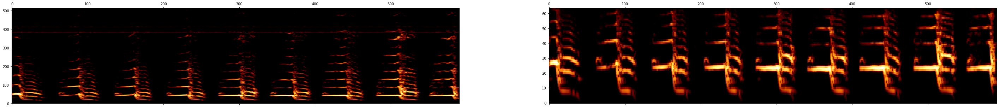

48


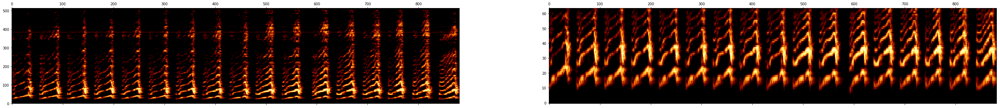

49


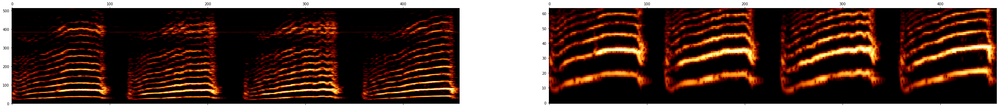

50


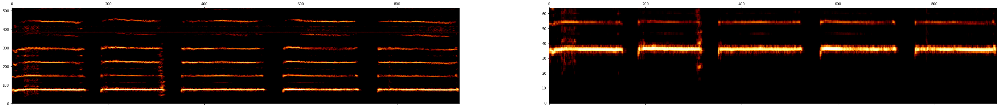

51


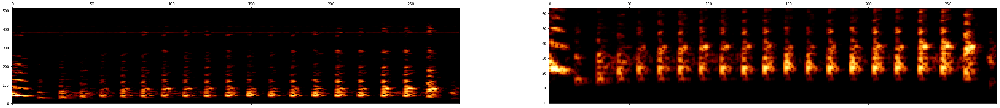

52


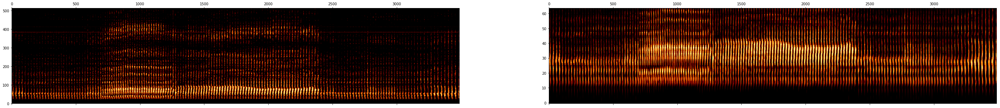

53


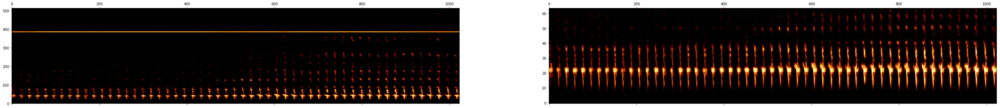

54


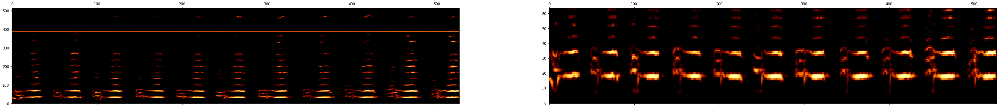

55


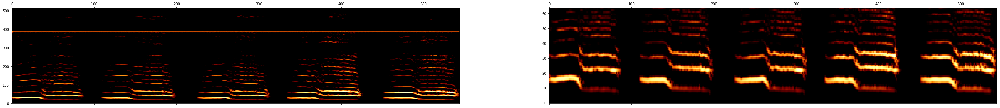

56


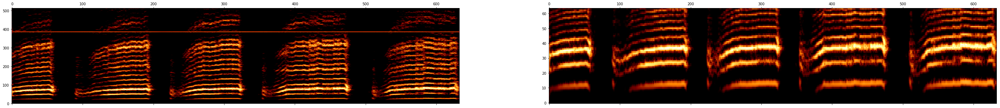

57


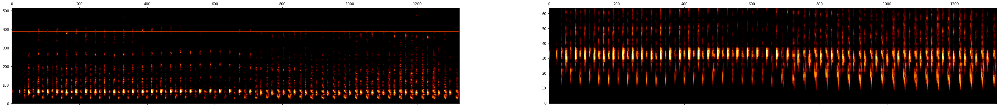

58


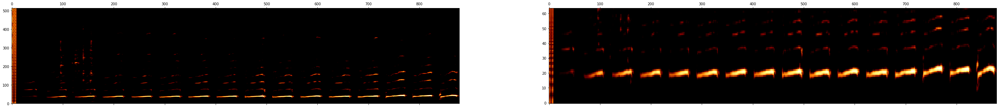

59


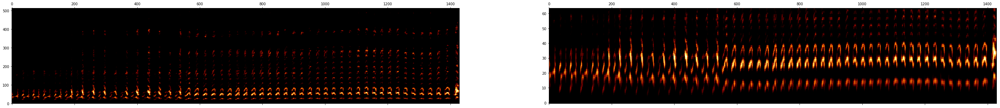

60


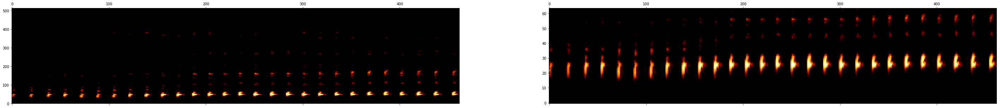

61


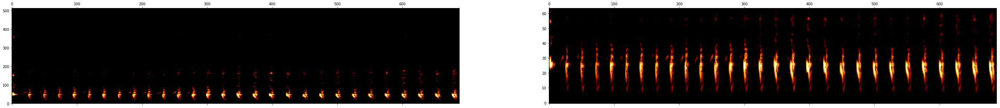

62


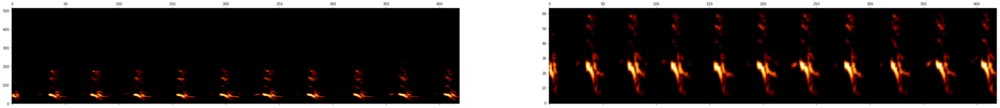

63


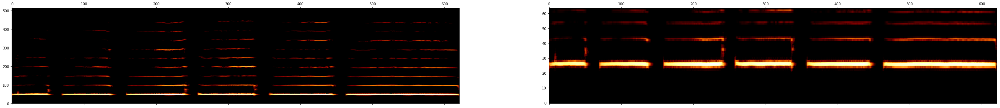

64


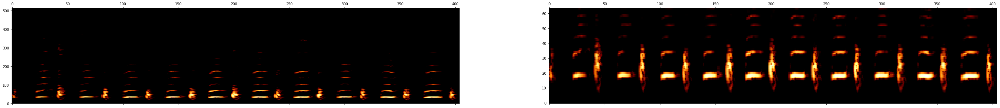

65


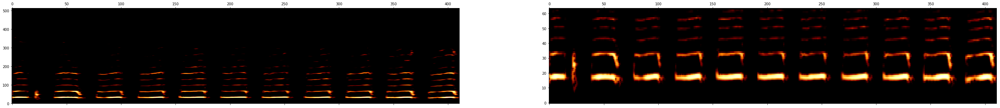

66


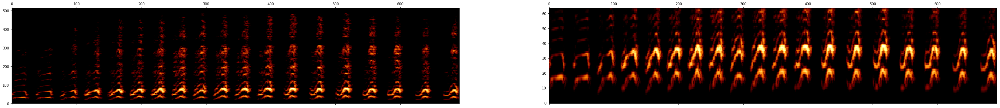

67


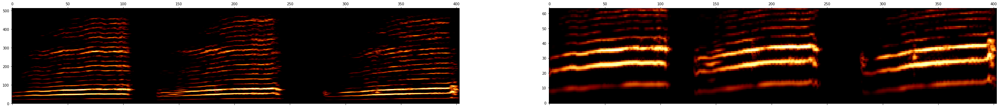

68


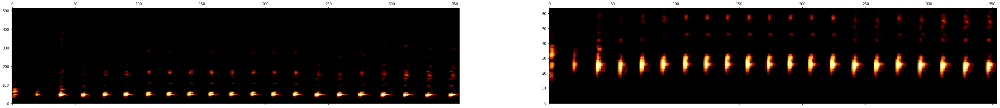

69


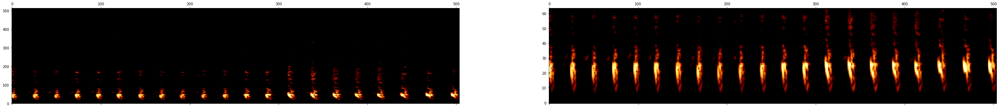

70


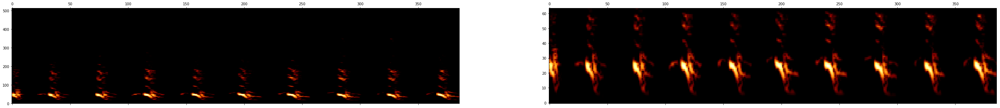

71


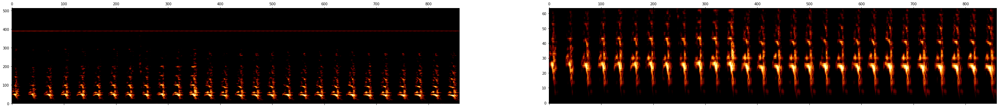

72


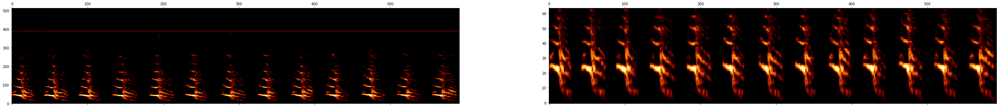

73


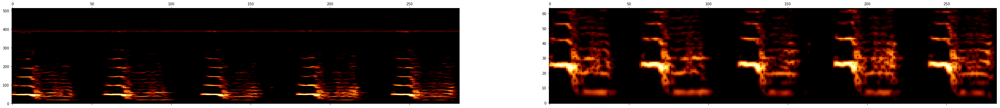

74


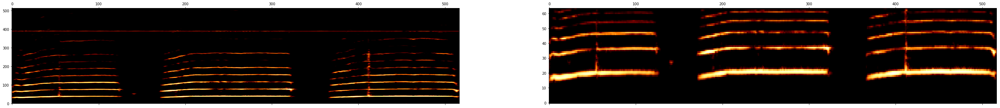

75


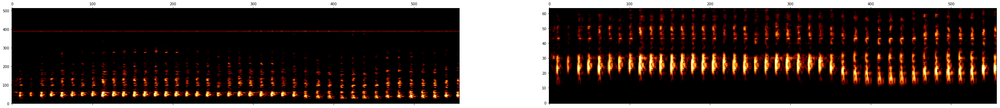

76


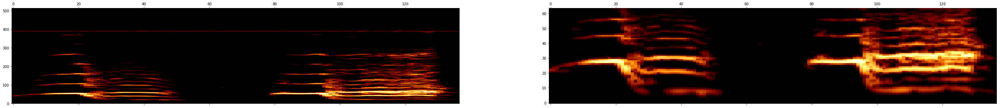

77


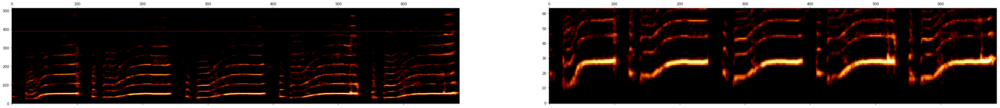

78


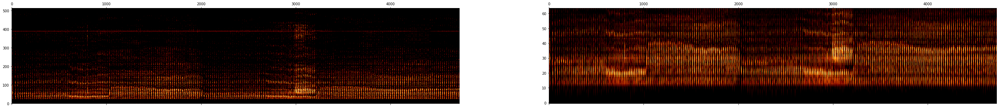

79


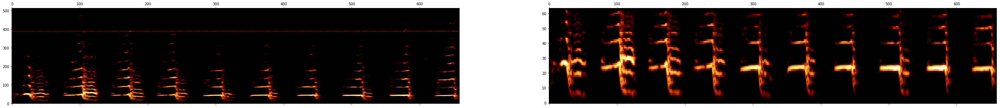

80


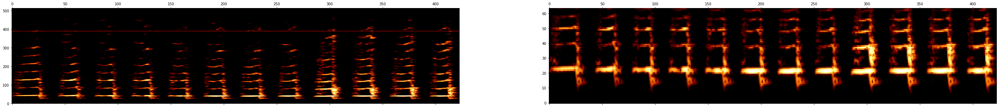

81


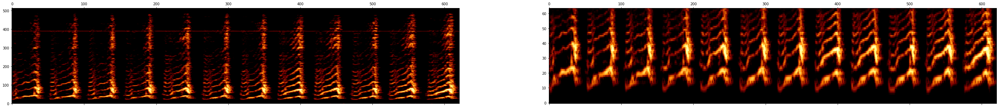

82


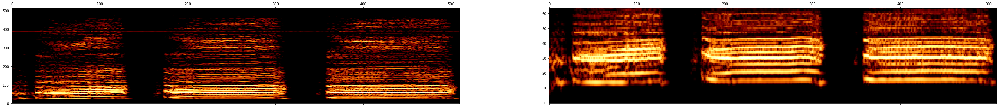

83


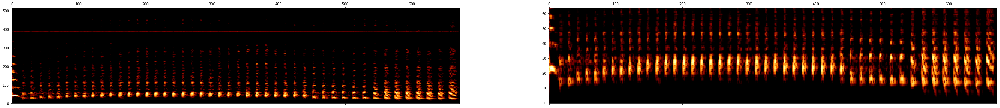

84


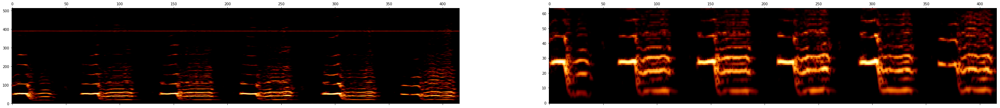

85


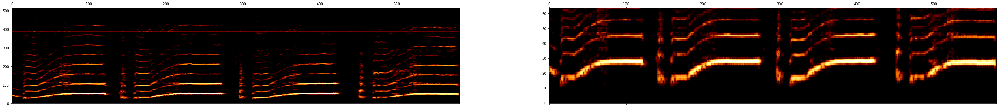

86


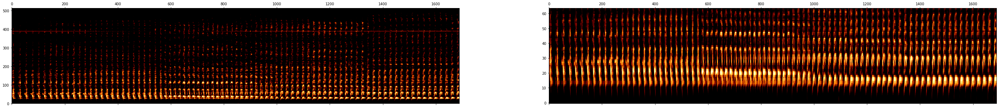

87


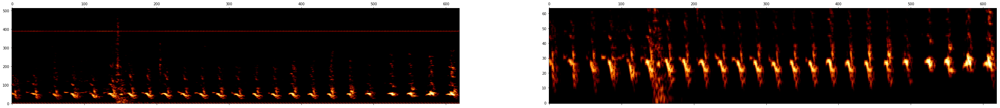

88


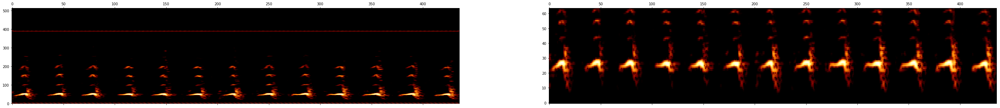

89


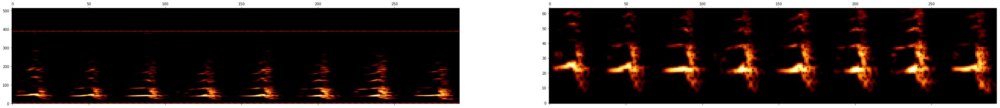

90


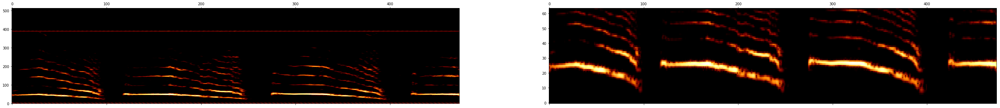

91


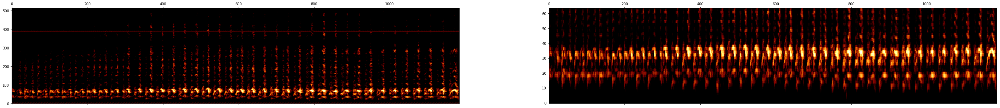

92


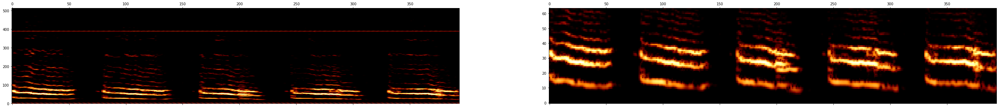

93


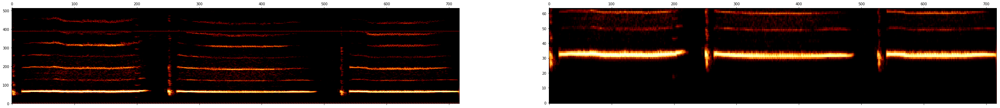

94


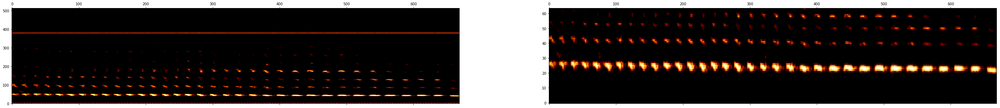

95


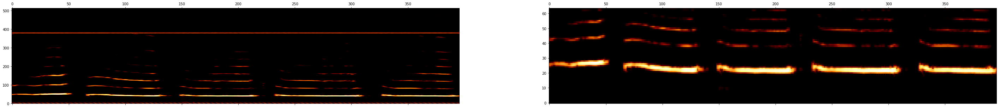

96


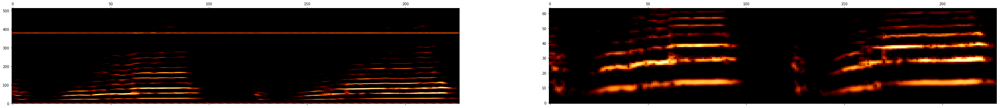

97


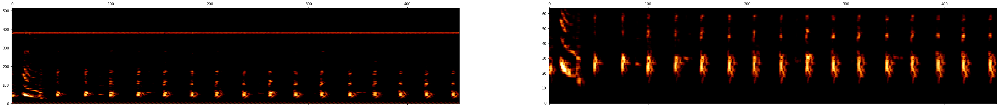

98


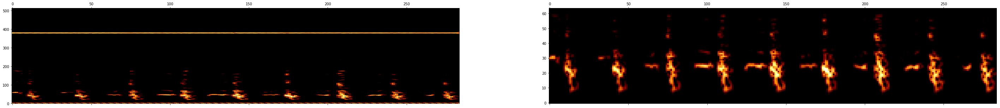

99


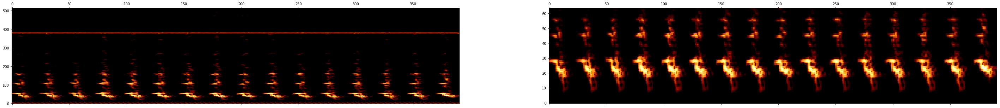

In [202]:
for i in range(100):
    print(i)
    audio = int16_to_float32(phrase_df.vocdata.values[i])
    spectrogram = sg.spectrogram(audio, hparams)
    mel_spec = np.dot(spectrogram.T, mel_matrix).T
    fig, axs = plt.subplots(ncols = 2, figsize=(50,5))
    axs[0].matshow(spectrogram, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
    axs[1].matshow(mel_spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
    #ax.axis('off')
    plt.show()

In [199]:
### 